# Import libraries

In [1]:
# import libraries
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import torchvision.models as models
from skimage.transform import resize
from numpy import asarray
import PIL.Image as Image

# import torchvision module to handle image manipulation
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import utils
import torchvision.datasets as dset
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import torch.optim as optim
from torchvision.utils import save_image
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid
from torch.autograd import Variable
from scipy import linalg

# Define Hyperparameters

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
img_size = 32
root_folder = "/content/drive/MyDrive/Sensity Assignment"
batch_size = 128
nc = 1 # number of channels in an image (RGB)
ngf = 32 # number of features in the generator
ndf = 32 # number of channels in the discriminator
nz = 100 # dimension of the latent space
n_class=10
lr = 0.0002 # learning rate for the networks
num_epochs = 50 # total number of training epochs

# Dataloader

In [3]:
# create a set of transforms for the dataset
dset_transforms = list()
dset_transforms.append(transforms.Resize(img_size))
dset_transforms.append(transforms.ToTensor())
dset_transforms.append(transforms.Normalize(
                                 [0.5], [0.5]))
dset_transforms = transforms.Compose(dset_transforms)

# Use standard FashionMNIST dataset
train_set = torchvision.datasets.FashionMNIST(
    root = root_folder,
    train = True,
    download = True,
    transform=dset_transforms
    )

  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw/train-images-idx3-ubyte.gz to /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /content/drive/MyDrive/Sensity Assignment/FashionMNIST/raw



In [4]:
data_loader = torch.utils.data.DataLoader(train_set, batch_size=batch_size, shuffle=True)

## Example of images

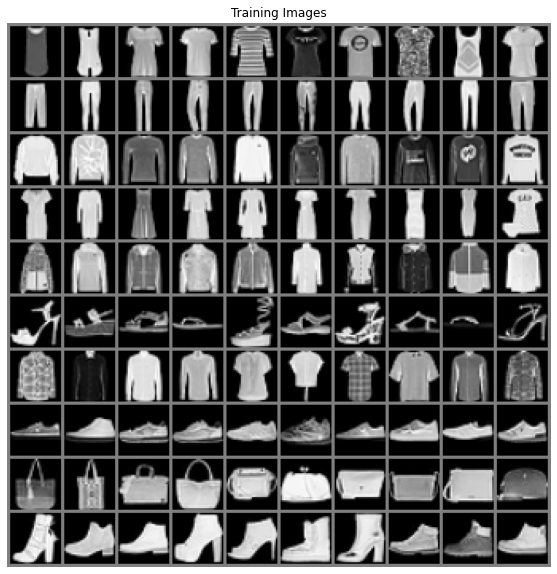

In [5]:
imgs = {}
for x, y in train_set:
    if y not in imgs:
        imgs[y] = []
    elif len(imgs[y])!=10:
        imgs[y].append(x)
    elif sum(len(imgs[key]) for key in imgs)==100:
        break
    else:
        continue
        
imgs = sorted(imgs.items(), key=lambda x:x[0])
imgs = [torch.stack(item[1], dim=0) for item in imgs]
imgs = torch.cat(imgs, dim=0)



plt.figure(figsize=(10,10))
plt.title("Training Images")
plt.axis('off')
imgs = utils.make_grid(imgs, nrow=10)
plt.imshow(imgs.permute(1, 2, 0)*0.5+0.5)


# Generator and Discriminator Model

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
class Generator(nn.Module):
    def __init__(self,num_classes: int = 10):
        super(Generator, self).__init__()
      
        self.image = nn.Sequential(

            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(inplace=True),
           

        )
        self.label = nn.Sequential(

            nn.ConvTranspose2d(num_classes, ngf * 8, 4, 1,0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(inplace=True),
            

        )
        self.main = nn.Sequential(

            nn.ConvTranspose2d(ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(inplace=True),
            

            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(inplace=True),
           

            nn.ConvTranspose2d(ngf*4, nc, 4, 2, 1, bias=False),
            nn.Tanh()
           
        )

    def forward(self, image, label):
        image = self.image(image)
        label = self.label(label)
        incat = torch.cat((image, label), dim=1)
        return self.main(incat)

In [8]:
# Create the generator
netG = Generator().to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

Generator(
  (image): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (label): Sequential(
    (0): ConvTranspose2d(10, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (main): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1)

In [9]:
class Discriminator(nn.Module):
    def __init__(self, num_classes: int = 10):
        super(Discriminator, self).__init__()

        self.image = nn.Sequential(

            nn.Conv2d(nc, ndf, 4, 2, 1,1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3)

        )
        self.label = nn.Sequential(

            nn.Conv2d(num_classes, ndf, 4, 2, 1,1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3)

        )
        self.main = nn.Sequential(

            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, image, label):
        image = self.image(image)
        label = self.label(label)
        incat = torch.cat((image, label), dim=1)
        return self.main(incat)

In [10]:
# Create the Discriminator
netD = Discriminator().to(device)

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (image): Sequential(
    (0): Conv2d(1, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.3, inplace=False)
  )
  (label): Sequential(
    (0): Conv2d(10, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.3, inplace=False)
  )
  (main): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): Dropout(p=0.3, inplace=False)
    (4): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (5): BatchN

# Pre-Trained Inception Network for Frechet Distance

In [11]:

class InceptionV3(nn.Module):
    """Pretrained InceptionV3 network returning feature maps"""

    # Index of default block of inception to return,
    # corresponds to output of final average pooling
    DEFAULT_BLOCK_INDEX = 3

    # Maps feature dimensionality to their output blocks indices
    BLOCK_INDEX_BY_DIM = {
        64: 0,   # First max pooling features
        192: 1,  # Second max pooling featurs
        768: 2,  # Pre-aux classifier features
        2048: 3  # Final average pooling features
    }

    def __init__(self,
                 output_blocks=[DEFAULT_BLOCK_INDEX],
                 resize_input=True,
                 normalize_input=True,
                 requires_grad=False):
        
        super(InceptionV3, self).__init__()

        self.resize_input = resize_input
        self.normalize_input = normalize_input
        self.output_blocks = sorted(output_blocks)
        self.last_needed_block = max(output_blocks)

        assert self.last_needed_block <= 3, \
            'Last possible output block index is 3'

        self.blocks = nn.ModuleList()

        
        inception = models.inception_v3(pretrained=True)

        # Block 0: input to maxpool1
        block0 = [
            inception.Conv2d_1a_3x3,
            inception.Conv2d_2a_3x3,
            inception.Conv2d_2b_3x3,
            nn.MaxPool2d(kernel_size=3, stride=2)
        ]
        self.blocks.append(nn.Sequential(*block0))
        # Block 1: maxpool1 to maxpool2
        if self.last_needed_block >= 1:
            block1 = [
                inception.Conv2d_3b_1x1,
                inception.Conv2d_4a_3x3,
                nn.MaxPool2d(kernel_size=3, stride=2)
            ]
            self.blocks.append(nn.Sequential(*block1))

        # Block 2: maxpool2 to aux classifier
        if self.last_needed_block >= 2:
            block2 = [
                inception.Mixed_5b,
                inception.Mixed_5c,
                inception.Mixed_5d,
                inception.Mixed_6a,
                inception.Mixed_6b,
                inception.Mixed_6c,
                inception.Mixed_6d,
                inception.Mixed_6e,
            ]
            self.blocks.append(nn.Sequential(*block2))

        # Block 3: aux classifier to final avgpool
        if self.last_needed_block >= 3:
          block3 = [
                inception.Mixed_7a,
                inception.Mixed_7b,
                inception.Mixed_7c,
                nn.AdaptiveAvgPool2d(output_size=(1, 1))
          ]
          self.blocks.append(nn.Sequential(*block3))

        for param in self.parameters():
            param.requires_grad = requires_grad

    def forward(self, inp):
        """Get Inception feature maps
        Parameters
        ----------
        inp : torch.autograd.Variable
            Input tensor of shape Bx3xHxW. Values are expected to be in
            range (0, 1)
        Returns
        -------
        List of torch.autograd.Variable, corresponding to the selected output
        block, sorted ascending by index
        """
        outp = []
        x = inp

        if self.resize_input:
          x = F.interpolate(x,
                              size=(299, 299),
                              mode='bilinear',
                              align_corners=False)

        if self.normalize_input:
            x = 2 * x - 1  # Scale from range (0, 1) to range (-1, 1)

        for idx, block in enumerate(self.blocks):
            x = block(x)
            if idx in self.output_blocks:
                outp.append(x)

            if idx == self.last_needed_block:
                break

        return outp
    
block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
model = InceptionV3([block_idx])
model=model.to(device)

def calculate_activation_statistics(images,model,batch_size=128, dims=2048,
                    cuda=False):
    model.eval()
    act=np.empty((len(images), dims))
    
    if cuda:
        batch=images.cuda()
    else:
        batch=images
    pred = model(batch)[0]

        # If model output is not scalar, apply global spatial average pooling.
        # This happens if you choose a dimensionality not equal 2048.
    if pred.size(2) != 1 or pred.size(3) != 1:
        pred = adaptive_avg_pool2d(pred, output_size=(1, 1))

    act= pred.cpu().data.numpy().reshape(pred.size(0), -1)
    
    mu = np.mean(act, axis=0)
    sigma = np.cov(act, rowvar=False)
    return mu, sigma


def calculate_frechet_distance(mu1, sigma1, mu2, sigma2, eps=1e-6):
    """Numpy implementation of the Frechet Distance.
    The Frechet distance between two multivariate Gaussians X_1 ~ N(mu_1, C_1)
    and X_2 ~ N(mu_2, C_2) is
            d^2 = ||mu_1 - mu_2||^2 + Tr(C_1 + C_2 - 2*sqrt(C_1*C_2)).
    """

    mu1 = np.atleast_1d(mu1)
    mu2 = np.atleast_1d(mu2)

    sigma1 = np.atleast_2d(sigma1)
    sigma2 = np.atleast_2d(sigma2)

    assert mu1.shape == mu2.shape, \
        'Training and test mean vectors have different lengths'
    assert sigma1.shape == sigma2.shape, \
        'Training and test covariances have different dimensions'

    diff = mu1 - mu2

    
    covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
    if not np.isfinite(covmean).all():
      msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
      print(msg)
      offset = np.eye(sigma1.shape[0]) * eps
      covmean = linalg.sqrtm((sigma1 + offset).dot(sigma2 + offset))

    
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real

    tr_covmean = np.trace(covmean)

    return (diff.dot(diff) + np.trace(sigma1) +
            np.trace(sigma2) - 2 * tr_covmean)
    
def calculate_fretchet(images_real,images_fake,model):
    mu_1,std_1=calculate_activation_statistics(images_real,model,cuda=True)
    mu_2,std_2=calculate_activation_statistics(images_fake,model,cuda=True)
    
    """get fretched distance"""
    fid_value = calculate_frechet_distance(mu_1, std_1, mu_2, std_2)
    return fid_value


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


  0%|          | 0.00/104M [00:00<?, ?B/s]

# Image Processing for FID Score

Fashion Mnist dataset is grayscale but in order to use FID score, 
I need to convert it to RGB and resize it in the end of the batch to calculate.

In [12]:
# scale an array of images to a new size

def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return np.uint8(images_list)
 
def interpolate(batch):
    arr = []
    for img in batch:
        pil_img = transforms.ToPILImage()(img)
        resized_img = pil_img.resize((299,299), Image.BILINEAR)
        resized_img.convert('RGB')
        arr.append(transforms.ToTensor()(resized_img))
    return torch.stack(arr)

# Training

In [13]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Establish convention for real and fake labels during training
real_label_num = 0.9
fake_label_num = 0.1

# Setup Adam optimizers for both G and D
optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

# Label one-hot for G
label_1hots = torch.zeros(10,10)
for i in range(10):
    label_1hots[i,i] = 1
label_1hots = label_1hots.view(10,10,1,1).to(device)

# Label one-hot for D
label_fills = torch.zeros(10, 10, img_size, img_size)
ones = torch.ones(img_size, img_size)
for i in range(10):
    label_fills[i][i] = ones
label_fills = label_fills.to(device)

# Create batch of latent vectors and laebls that we will use to visualize the progression of the generator
fixed_noise = torch.randn(batch_size, nz, 1, 1).to(device)
fixed_label = label_1hots[torch.randint(0, 10, (batch_size,)).sort().values]

Starting Training Loop...
[  0/50][  0/469]	Loss_D: 1.5284	Loss_G: 1.0803	D(x): 0.6033	D(G(z)): 0.5558 / 0.3673


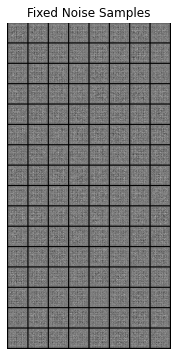

Fretchet Score 32.40198938371668
model saved.
[  0/50][100/469]	Loss_D: 1.1273	Loss_G: 2.8463	D(x): 0.7688	D(G(z)): 0.3896 / 0.0692
[  0/50][200/469]	Loss_D: 1.0217	Loss_G: 1.4575	D(x): 0.6425	D(G(z)): 0.1979 / 0.2645
[  0/50][300/469]	Loss_D: 1.0017	Loss_G: 1.9272	D(x): 0.7340	D(G(z)): 0.3360 / 0.1756
[  0/50][400/469]	Loss_D: 1.3672	Loss_G: 0.8542	D(x): 0.4413	D(G(z)): 0.0807 / 0.4968


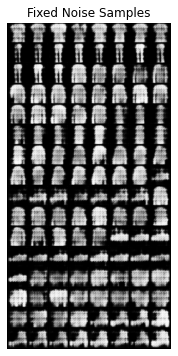

Fretchet Score 44.13528525948286
[  1/50][ 31/469]	Loss_D: 1.1095	Loss_G: 1.0602	D(x): 0.5455	D(G(z)): 0.1481 / 0.3891
[  1/50][131/469]	Loss_D: 1.1787	Loss_G: 2.0547	D(x): 0.6905	D(G(z)): 0.3976 / 0.1455
[  1/50][231/469]	Loss_D: 0.9961	Loss_G: 1.8146	D(x): 0.7523	D(G(z)): 0.3287 / 0.1836
[  1/50][331/469]	Loss_D: 0.9865	Loss_G: 1.6678	D(x): 0.7391	D(G(z)): 0.3007 / 0.2056
[  1/50][431/469]	Loss_D: 1.0065	Loss_G: 1.3640	D(x): 0.7166	D(G(z)): 0.3161 / 0.2749


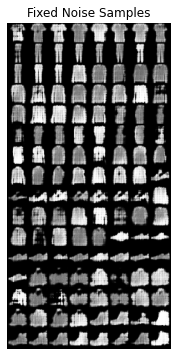

Fretchet Score 24.220638156102588
model saved.
[  2/50][ 62/469]	Loss_D: 1.0131	Loss_G: 1.3724	D(x): 0.6708	D(G(z)): 0.2567 / 0.2884
[  2/50][162/469]	Loss_D: 1.1580	Loss_G: 1.0206	D(x): 0.5382	D(G(z)): 0.1936 / 0.4071
[  2/50][262/469]	Loss_D: 1.0802	Loss_G: 1.2761	D(x): 0.6260	D(G(z)): 0.2710 / 0.3010
[  2/50][362/469]	Loss_D: 0.9769	Loss_G: 1.3912	D(x): 0.7002	D(G(z)): 0.2946 / 0.2737
[  2/50][462/469]	Loss_D: 1.0727	Loss_G: 1.0324	D(x): 0.6100	D(G(z)): 0.2521 / 0.3893


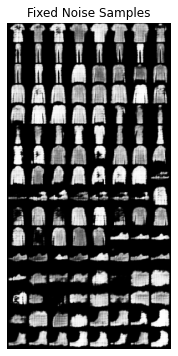

Fretchet Score 29.53762368577386
[  3/50][ 93/469]	Loss_D: 1.0828	Loss_G: 1.6177	D(x): 0.7843	D(G(z)): 0.4250 / 0.2255
[  3/50][193/469]	Loss_D: 1.0474	Loss_G: 1.3674	D(x): 0.6875	D(G(z)): 0.3346 / 0.2812
[  3/50][293/469]	Loss_D: 1.1012	Loss_G: 1.5442	D(x): 0.6968	D(G(z)): 0.3865 / 0.2407
[  3/50][393/469]	Loss_D: 1.0901	Loss_G: 1.2882	D(x): 0.6873	D(G(z)): 0.3609 / 0.3001


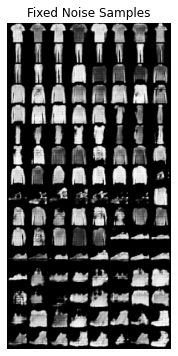

Fretchet Score 23.468401321447505
model saved.
[  4/50][ 24/469]	Loss_D: 1.0704	Loss_G: 1.3415	D(x): 0.6871	D(G(z)): 0.3606 / 0.2761
[  4/50][124/469]	Loss_D: 1.0327	Loss_G: 1.3121	D(x): 0.7060	D(G(z)): 0.3426 / 0.2880
[  4/50][224/469]	Loss_D: 1.0921	Loss_G: 1.3468	D(x): 0.7756	D(G(z)): 0.4290 / 0.2920
[  4/50][324/469]	Loss_D: 1.2003	Loss_G: 1.4880	D(x): 0.6696	D(G(z)): 0.4408 / 0.2344
[  4/50][424/469]	Loss_D: 1.1507	Loss_G: 1.0937	D(x): 0.5875	D(G(z)): 0.3158 / 0.3488


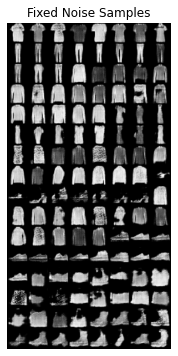

Fretchet Score 26.51518151695079
[  5/50][ 55/469]	Loss_D: 1.1871	Loss_G: 1.4229	D(x): 0.6868	D(G(z)): 0.4354 / 0.2545
[  5/50][155/469]	Loss_D: 1.1037	Loss_G: 1.3334	D(x): 0.7051	D(G(z)): 0.4130 / 0.2740
[  5/50][255/469]	Loss_D: 1.0571	Loss_G: 1.2946	D(x): 0.6945	D(G(z)): 0.3675 / 0.2889
[  5/50][355/469]	Loss_D: 1.1604	Loss_G: 1.2268	D(x): 0.6930	D(G(z)): 0.4226 / 0.3121
[  5/50][455/469]	Loss_D: 1.1003	Loss_G: 1.1873	D(x): 0.6491	D(G(z)): 0.3627 / 0.3288


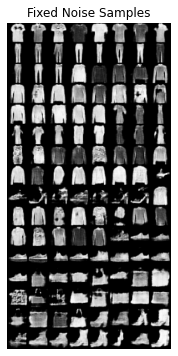

Fretchet Score 21.951861880299735
model saved.
[  6/50][ 86/469]	Loss_D: 1.1580	Loss_G: 1.2556	D(x): 0.6427	D(G(z)): 0.3960 / 0.3046
[  6/50][186/469]	Loss_D: 1.2100	Loss_G: 1.3395	D(x): 0.6897	D(G(z)): 0.4538 / 0.2783
[  6/50][286/469]	Loss_D: 1.1168	Loss_G: 1.0765	D(x): 0.6625	D(G(z)): 0.3666 / 0.3634
[  6/50][386/469]	Loss_D: 1.1703	Loss_G: 1.0071	D(x): 0.5921	D(G(z)): 0.3729 / 0.3894


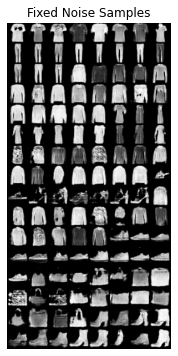

Fretchet Score 24.686519689608918
[  7/50][ 17/469]	Loss_D: 1.0901	Loss_G: 1.2859	D(x): 0.7090	D(G(z)): 0.4089 / 0.2907
[  7/50][117/469]	Loss_D: 1.1962	Loss_G: 1.1374	D(x): 0.6245	D(G(z)): 0.4018 / 0.3438
[  7/50][217/469]	Loss_D: 1.2176	Loss_G: 0.9075	D(x): 0.5313	D(G(z)): 0.3152 / 0.4364
[  7/50][317/469]	Loss_D: 1.2038	Loss_G: 1.3407	D(x): 0.7253	D(G(z)): 0.4924 / 0.2774
[  7/50][417/469]	Loss_D: 1.1422	Loss_G: 1.2757	D(x): 0.6774	D(G(z)): 0.4095 / 0.2943


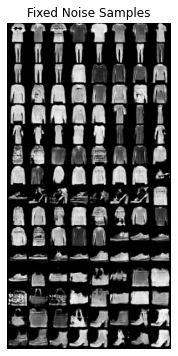

Fretchet Score 24.29707996614129
[  8/50][ 48/469]	Loss_D: 1.1211	Loss_G: 1.2719	D(x): 0.6708	D(G(z)): 0.4076 / 0.2954
[  8/50][148/469]	Loss_D: 1.1728	Loss_G: 1.2037	D(x): 0.6716	D(G(z)): 0.4402 / 0.3149
[  8/50][248/469]	Loss_D: 1.1829	Loss_G: 1.0142	D(x): 0.6011	D(G(z)): 0.3768 / 0.3867
[  8/50][348/469]	Loss_D: 1.2473	Loss_G: 1.3770	D(x): 0.7122	D(G(z)): 0.5018 / 0.2555
[  8/50][448/469]	Loss_D: 1.1684	Loss_G: 1.1330	D(x): 0.6515	D(G(z)): 0.4091 / 0.3382


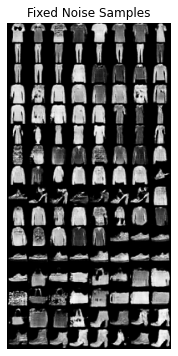

Fretchet Score 17.43656983672213
model saved.
[  9/50][ 79/469]	Loss_D: 1.2770	Loss_G: 1.6996	D(x): 0.7697	D(G(z)): 0.5387 / 0.1947
[  9/50][179/469]	Loss_D: 1.1467	Loss_G: 1.2805	D(x): 0.6611	D(G(z)): 0.3929 / 0.2840
[  9/50][279/469]	Loss_D: 1.2434	Loss_G: 1.0213	D(x): 0.5973	D(G(z)): 0.4149 / 0.3795
[  9/50][379/469]	Loss_D: 1.1403	Loss_G: 1.0469	D(x): 0.5853	D(G(z)): 0.3334 / 0.3817


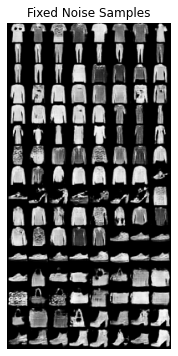

Fretchet Score 19.092285612920854
[ 10/50][ 10/469]	Loss_D: 1.1677	Loss_G: 1.3888	D(x): 0.7260	D(G(z)): 0.4697 / 0.2613
[ 10/50][110/469]	Loss_D: 1.1543	Loss_G: 1.0778	D(x): 0.5864	D(G(z)): 0.3546 / 0.3648
[ 10/50][210/469]	Loss_D: 1.2354	Loss_G: 1.2850	D(x): 0.6072	D(G(z)): 0.4229 / 0.2900
[ 10/50][310/469]	Loss_D: 1.2091	Loss_G: 1.2227	D(x): 0.6069	D(G(z)): 0.4068 / 0.3180
[ 10/50][410/469]	Loss_D: 1.1848	Loss_G: 1.0804	D(x): 0.6673	D(G(z)): 0.4431 / 0.3593


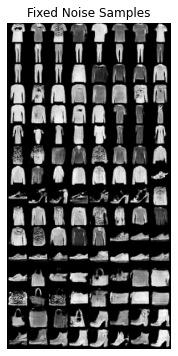

Fretchet Score 20.431102367955564
[ 11/50][ 41/469]	Loss_D: 1.0997	Loss_G: 1.2619	D(x): 0.6829	D(G(z)): 0.3900 / 0.3051
[ 11/50][141/469]	Loss_D: 1.1312	Loss_G: 1.2866	D(x): 0.7075	D(G(z)): 0.4426 / 0.2862
[ 11/50][241/469]	Loss_D: 1.1281	Loss_G: 1.1172	D(x): 0.6969	D(G(z)): 0.4260 / 0.3407
[ 11/50][341/469]	Loss_D: 1.0995	Loss_G: 1.0250	D(x): 0.6295	D(G(z)): 0.3234 / 0.3852
[ 11/50][441/469]	Loss_D: 1.1193	Loss_G: 1.2425	D(x): 0.6514	D(G(z)): 0.3913 / 0.3146


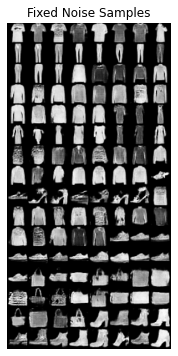

Fretchet Score 20.376746420870745
[ 12/50][ 72/469]	Loss_D: 1.1865	Loss_G: 1.4840	D(x): 0.7242	D(G(z)): 0.4726 / 0.2378
[ 12/50][172/469]	Loss_D: 1.1688	Loss_G: 1.1349	D(x): 0.6449	D(G(z)): 0.4053 / 0.3367
[ 12/50][272/469]	Loss_D: 1.0972	Loss_G: 1.2781	D(x): 0.6127	D(G(z)): 0.3046 / 0.2870
[ 12/50][372/469]	Loss_D: 1.1785	Loss_G: 1.2028	D(x): 0.6484	D(G(z)): 0.4151 / 0.3061


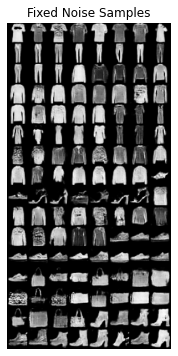

Fretchet Score 20.636742584262855
[ 13/50][  3/469]	Loss_D: 1.1245	Loss_G: 1.1537	D(x): 0.5877	D(G(z)): 0.3068 / 0.3363
[ 13/50][103/469]	Loss_D: 1.2264	Loss_G: 0.8907	D(x): 0.5067	D(G(z)): 0.2712 / 0.4450
[ 13/50][203/469]	Loss_D: 1.0845	Loss_G: 1.1635	D(x): 0.5907	D(G(z)): 0.3026 / 0.3258
[ 13/50][303/469]	Loss_D: 1.1553	Loss_G: 1.4066	D(x): 0.7221	D(G(z)): 0.4518 / 0.2664
[ 13/50][403/469]	Loss_D: 1.0784	Loss_G: 1.6244	D(x): 0.7080	D(G(z)): 0.3876 / 0.2055


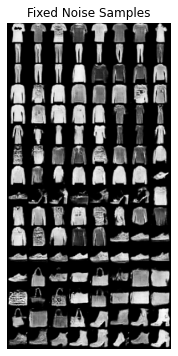

Fretchet Score 17.21122744185416
model saved.
[ 14/50][ 34/469]	Loss_D: 1.3006	Loss_G: 1.1945	D(x): 0.4620	D(G(z)): 0.2435 / 0.3267
[ 14/50][134/469]	Loss_D: 0.9950	Loss_G: 1.3036	D(x): 0.7080	D(G(z)): 0.3322 / 0.2947
[ 14/50][234/469]	Loss_D: 1.0723	Loss_G: 1.3246	D(x): 0.6431	D(G(z)): 0.3163 / 0.2813
[ 14/50][334/469]	Loss_D: 1.0440	Loss_G: 1.4688	D(x): 0.7471	D(G(z)): 0.3945 / 0.2478
[ 14/50][434/469]	Loss_D: 1.0572	Loss_G: 1.3988	D(x): 0.6807	D(G(z)): 0.3511 / 0.2628


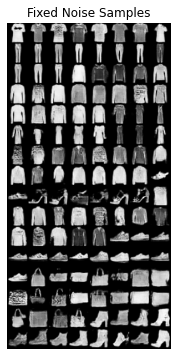

Fretchet Score 19.420265656415737
[ 15/50][ 65/469]	Loss_D: 1.1175	Loss_G: 1.3143	D(x): 0.5796	D(G(z)): 0.2711 / 0.2891
[ 15/50][165/469]	Loss_D: 1.0492	Loss_G: 1.3329	D(x): 0.6920	D(G(z)): 0.3368 / 0.2831
[ 15/50][265/469]	Loss_D: 1.0154	Loss_G: 1.2017	D(x): 0.6789	D(G(z)): 0.3048 / 0.3358
[ 15/50][365/469]	Loss_D: 1.2740	Loss_G: 1.0067	D(x): 0.5252	D(G(z)): 0.3391 / 0.3843
[ 15/50][465/469]	Loss_D: 1.0508	Loss_G: 1.2563	D(x): 0.6601	D(G(z)): 0.3118 / 0.3181


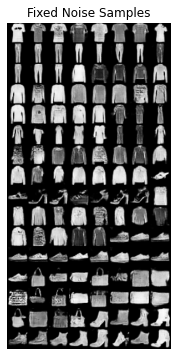

Fretchet Score 21.428969253945418
[ 16/50][ 96/469]	Loss_D: 1.0923	Loss_G: 1.2105	D(x): 0.5982	D(G(z)): 0.2844 / 0.3265
[ 16/50][196/469]	Loss_D: 1.1991	Loss_G: 0.8082	D(x): 0.5827	D(G(z)): 0.3612 / 0.4845
[ 16/50][296/469]	Loss_D: 1.1190	Loss_G: 1.3370	D(x): 0.7667	D(G(z)): 0.4494 / 0.2833
[ 16/50][396/469]	Loss_D: 1.1216	Loss_G: 1.0457	D(x): 0.5797	D(G(z)): 0.2637 / 0.3933


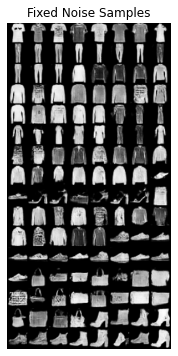

Fretchet Score 18.123018568724504
[ 17/50][ 27/469]	Loss_D: 1.0221	Loss_G: 1.2391	D(x): 0.6594	D(G(z)): 0.3004 / 0.3183
[ 17/50][127/469]	Loss_D: 0.9407	Loss_G: 1.6251	D(x): 0.6949	D(G(z)): 0.2622 / 0.2101
[ 17/50][227/469]	Loss_D: 0.9997	Loss_G: 1.2130	D(x): 0.6707	D(G(z)): 0.2683 / 0.3231
[ 17/50][327/469]	Loss_D: 1.0888	Loss_G: 1.4705	D(x): 0.6794	D(G(z)): 0.3646 / 0.2472
[ 17/50][427/469]	Loss_D: 1.0322	Loss_G: 1.1259	D(x): 0.6343	D(G(z)): 0.2490 / 0.3553


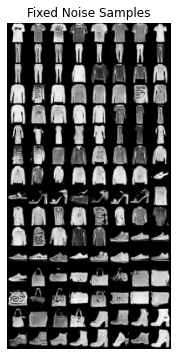

Fretchet Score 28.836489100975037
[ 18/50][ 58/469]	Loss_D: 1.3979	Loss_G: 0.8175	D(x): 0.4968	D(G(z)): 0.3784 / 0.4931
[ 18/50][158/469]	Loss_D: 0.9909	Loss_G: 1.4223	D(x): 0.7123	D(G(z)): 0.3317 / 0.2548
[ 18/50][258/469]	Loss_D: 0.9909	Loss_G: 1.2635	D(x): 0.7381	D(G(z)): 0.3370 / 0.3112
[ 18/50][358/469]	Loss_D: 1.0043	Loss_G: 1.5113	D(x): 0.7166	D(G(z)): 0.3048 / 0.2372
[ 18/50][458/469]	Loss_D: 1.0202	Loss_G: 1.1835	D(x): 0.6668	D(G(z)): 0.2857 / 0.3402


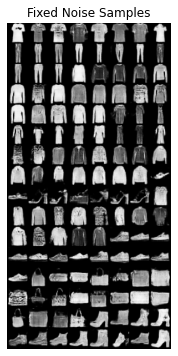

Fretchet Score 17.907988206756876
[ 19/50][ 89/469]	Loss_D: 0.9942	Loss_G: 1.4140	D(x): 0.6848	D(G(z)): 0.2881 / 0.2654
[ 19/50][189/469]	Loss_D: 0.9645	Loss_G: 1.7012	D(x): 0.7202	D(G(z)): 0.2826 / 0.2004
[ 19/50][289/469]	Loss_D: 0.9456	Loss_G: 1.3193	D(x): 0.7553	D(G(z)): 0.3058 / 0.2896
[ 19/50][389/469]	Loss_D: 0.9921	Loss_G: 1.3802	D(x): 0.7323	D(G(z)): 0.3038 / 0.2677


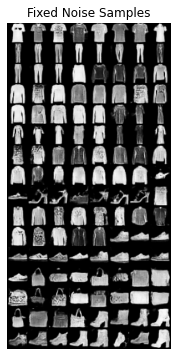

Fretchet Score 17.11151622067256
model saved.
[ 20/50][ 20/469]	Loss_D: 0.9997	Loss_G: 1.1886	D(x): 0.6481	D(G(z)): 0.2456 / 0.3257
[ 20/50][120/469]	Loss_D: 0.9010	Loss_G: 1.5131	D(x): 0.6979	D(G(z)): 0.1866 / 0.2395
[ 20/50][220/469]	Loss_D: 0.9994	Loss_G: 1.1485	D(x): 0.6499	D(G(z)): 0.2456 / 0.3325
[ 20/50][320/469]	Loss_D: 0.9766	Loss_G: 1.2190	D(x): 0.6907	D(G(z)): 0.2790 / 0.3203
[ 20/50][420/469]	Loss_D: 1.1286	Loss_G: 2.1276	D(x): 0.7852	D(G(z)): 0.4508 / 0.1271


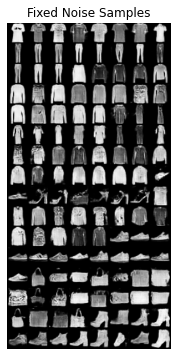

Fretchet Score 22.051641892984613
[ 21/50][ 51/469]	Loss_D: 0.9290	Loss_G: 1.4264	D(x): 0.6695	D(G(z)): 0.2029 / 0.2654
[ 21/50][151/469]	Loss_D: 0.9915	Loss_G: 1.4479	D(x): 0.7180	D(G(z)): 0.3202 / 0.2542
[ 21/50][251/469]	Loss_D: 1.0149	Loss_G: 1.0972	D(x): 0.6020	D(G(z)): 0.1900 / 0.3784
[ 21/50][351/469]	Loss_D: 1.1704	Loss_G: 1.3394	D(x): 0.6789	D(G(z)): 0.3972 / 0.2864
[ 21/50][451/469]	Loss_D: 0.9063	Loss_G: 1.5860	D(x): 0.7762	D(G(z)): 0.2915 / 0.2304


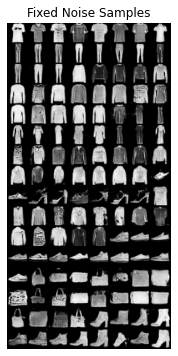

Fretchet Score 24.798171008453597
[ 22/50][ 82/469]	Loss_D: 1.0558	Loss_G: 2.9958	D(x): 0.8753	D(G(z)): 0.4398 / 0.0540
[ 22/50][182/469]	Loss_D: 0.9383	Loss_G: 1.3512	D(x): 0.7366	D(G(z)): 0.2717 / 0.2871
[ 22/50][282/469]	Loss_D: 0.9718	Loss_G: 1.5415	D(x): 0.7445	D(G(z)): 0.3095 / 0.2450
[ 22/50][382/469]	Loss_D: 0.9386	Loss_G: 1.5756	D(x): 0.7928	D(G(z)): 0.3236 / 0.2293


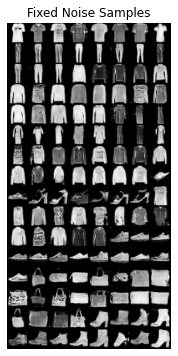

Fretchet Score 26.0992621726007
[ 23/50][ 13/469]	Loss_D: 0.9135	Loss_G: 1.6078	D(x): 0.7962	D(G(z)): 0.3066 / 0.2241
[ 23/50][113/469]	Loss_D: 1.2415	Loss_G: 1.2543	D(x): 0.6179	D(G(z)): 0.3803 / 0.3339
[ 23/50][213/469]	Loss_D: 1.0169	Loss_G: 1.6872	D(x): 0.7876	D(G(z)): 0.3888 / 0.1954
[ 23/50][313/469]	Loss_D: 0.9571	Loss_G: 1.4312	D(x): 0.6968	D(G(z)): 0.2662 / 0.2609
[ 23/50][413/469]	Loss_D: 0.9459	Loss_G: 1.5749	D(x): 0.7225	D(G(z)): 0.2772 / 0.2230


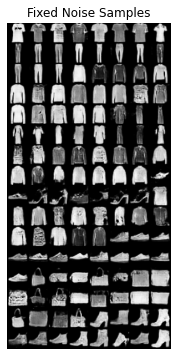

Fretchet Score 27.23166598013023
[ 24/50][ 44/469]	Loss_D: 1.0201	Loss_G: 1.2923	D(x): 0.5991	D(G(z)): 0.1734 / 0.2855
[ 24/50][144/469]	Loss_D: 0.9456	Loss_G: 1.5488	D(x): 0.6848	D(G(z)): 0.2141 / 0.2389
[ 24/50][244/469]	Loss_D: 0.9458	Loss_G: 1.4419	D(x): 0.6968	D(G(z)): 0.2416 / 0.2656
[ 24/50][344/469]	Loss_D: 1.2589	Loss_G: 0.9904	D(x): 0.4734	D(G(z)): 0.2204 / 0.4251
[ 24/50][444/469]	Loss_D: 0.9626	Loss_G: 1.4417	D(x): 0.7218	D(G(z)): 0.2962 / 0.2564


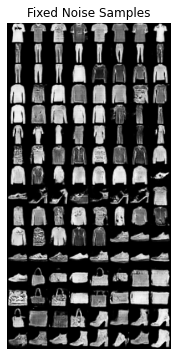

Fretchet Score 29.692410995903774
[ 25/50][ 75/469]	Loss_D: 0.9794	Loss_G: 1.2589	D(x): 0.6663	D(G(z)): 0.2388 / 0.3026
[ 25/50][175/469]	Loss_D: 0.9192	Loss_G: 1.6582	D(x): 0.7445	D(G(z)): 0.2742 / 0.2171
[ 25/50][275/469]	Loss_D: 1.0710	Loss_G: 1.5421	D(x): 0.6647	D(G(z)): 0.3173 / 0.2335
[ 25/50][375/469]	Loss_D: 1.1510	Loss_G: 1.5361	D(x): 0.6411	D(G(z)): 0.3530 / 0.2340


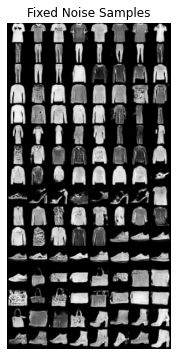

Fretchet Score 19.9066394164646
[ 26/50][  6/469]	Loss_D: 0.9435	Loss_G: 1.7503	D(x): 0.7393	D(G(z)): 0.2739 / 0.1966
[ 26/50][106/469]	Loss_D: 1.0259	Loss_G: 2.9560	D(x): 0.8105	D(G(z)): 0.3929 / 0.0576
[ 26/50][206/469]	Loss_D: 1.0422	Loss_G: 1.9163	D(x): 0.8287	D(G(z)): 0.4141 / 0.1605
[ 26/50][306/469]	Loss_D: 0.9424	Loss_G: 1.4733	D(x): 0.6640	D(G(z)): 0.1878 / 0.2485
[ 26/50][406/469]	Loss_D: 0.9397	Loss_G: 1.9829	D(x): 0.8251	D(G(z)): 0.3406 / 0.1509


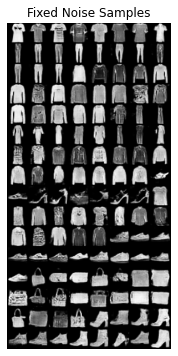

Fretchet Score 25.090248303791434
[ 27/50][ 37/469]	Loss_D: 0.9027	Loss_G: 1.5239	D(x): 0.7895	D(G(z)): 0.2950 / 0.2408
[ 27/50][137/469]	Loss_D: 0.9233	Loss_G: 1.3517	D(x): 0.7143	D(G(z)): 0.2292 / 0.2857
[ 27/50][237/469]	Loss_D: 1.2547	Loss_G: 1.3373	D(x): 0.6028	D(G(z)): 0.3768 / 0.3088
[ 27/50][337/469]	Loss_D: 1.0296	Loss_G: 1.4528	D(x): 0.7733	D(G(z)): 0.3646 / 0.2602
[ 27/50][437/469]	Loss_D: 0.8870	Loss_G: 1.5391	D(x): 0.7489	D(G(z)): 0.2316 / 0.2346


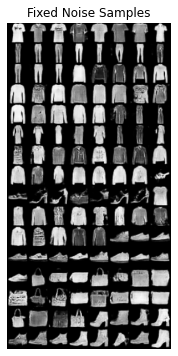

Fretchet Score 24.815202341213144
[ 28/50][ 68/469]	Loss_D: 1.2107	Loss_G: 1.3264	D(x): 0.6469	D(G(z)): 0.3891 / 0.2860
[ 28/50][168/469]	Loss_D: 0.9590	Loss_G: 1.5870	D(x): 0.7637	D(G(z)): 0.3057 / 0.2282
[ 28/50][268/469]	Loss_D: 0.9205	Loss_G: 1.8809	D(x): 0.7736	D(G(z)): 0.2926 / 0.1666
[ 28/50][368/469]	Loss_D: 1.1315	Loss_G: 1.4347	D(x): 0.7784	D(G(z)): 0.4227 / 0.2575
[ 28/50][468/469]	Loss_D: 0.9231	Loss_G: 1.7083	D(x): 0.7270	D(G(z)): 0.2564 / 0.2033


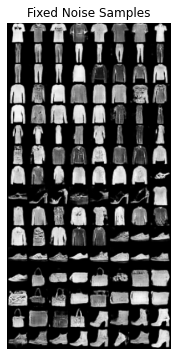

Fretchet Score 28.039895377638274
[ 29/50][ 99/469]	Loss_D: 0.8823	Loss_G: 1.8582	D(x): 0.7752	D(G(z)): 0.2569 / 0.1780
[ 29/50][199/469]	Loss_D: 0.9961	Loss_G: 1.2597	D(x): 0.6525	D(G(z)): 0.2324 / 0.3092
[ 29/50][299/469]	Loss_D: 0.9719	Loss_G: 1.3651	D(x): 0.6950	D(G(z)): 0.2655 / 0.2875
[ 29/50][399/469]	Loss_D: 0.9568	Loss_G: 1.3731	D(x): 0.7363	D(G(z)): 0.3005 / 0.2731


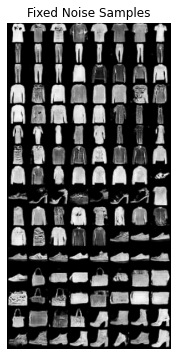

Fretchet Score 26.95185241718776
[ 30/50][ 30/469]	Loss_D: 0.9365	Loss_G: 1.3442	D(x): 0.8629	D(G(z)): 0.3478 / 0.2888
[ 30/50][130/469]	Loss_D: 0.9832	Loss_G: 1.4982	D(x): 0.6776	D(G(z)): 0.2643 / 0.2559
[ 30/50][230/469]	Loss_D: 1.0598	Loss_G: 1.3391	D(x): 0.6013	D(G(z)): 0.2131 / 0.3077
[ 30/50][330/469]	Loss_D: 1.0367	Loss_G: 1.4259	D(x): 0.6798	D(G(z)): 0.2953 / 0.2689
[ 30/50][430/469]	Loss_D: 0.9775	Loss_G: 1.1929	D(x): 0.7033	D(G(z)): 0.2770 / 0.3499


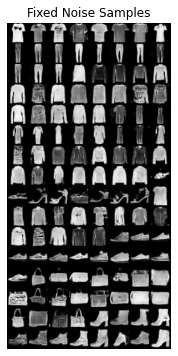

Fretchet Score 23.05495182868814
[ 31/50][ 61/469]	Loss_D: 0.9299	Loss_G: 1.3833	D(x): 0.6978	D(G(z)): 0.2032 / 0.2771
[ 31/50][161/469]	Loss_D: 0.9201	Loss_G: 1.7347	D(x): 0.7322	D(G(z)): 0.2480 / 0.1997
[ 31/50][261/469]	Loss_D: 1.6474	Loss_G: 2.2316	D(x): 0.9167	D(G(z)): 0.6774 / 0.1274
[ 31/50][361/469]	Loss_D: 0.9748	Loss_G: 1.8171	D(x): 0.7258	D(G(z)): 0.2828 / 0.1964
[ 31/50][461/469]	Loss_D: 0.8593	Loss_G: 1.5888	D(x): 0.7836	D(G(z)): 0.2492 / 0.2302


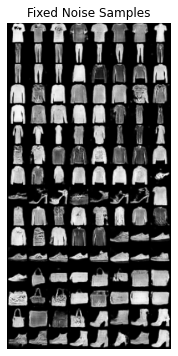

Fretchet Score 20.07910085183826
[ 32/50][ 92/469]	Loss_D: 0.9490	Loss_G: 1.6004	D(x): 0.7119	D(G(z)): 0.2559 / 0.2333
[ 32/50][192/469]	Loss_D: 1.0398	Loss_G: 2.0706	D(x): 0.7980	D(G(z)): 0.3912 / 0.1464
[ 32/50][292/469]	Loss_D: 0.8206	Loss_G: 1.5978	D(x): 0.8072	D(G(z)): 0.2214 / 0.2277
[ 32/50][392/469]	Loss_D: 0.8552	Loss_G: 1.6898	D(x): 0.8175	D(G(z)): 0.2409 / 0.1962


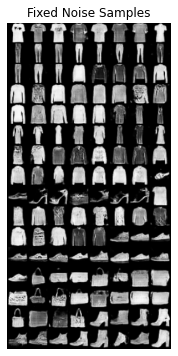

Fretchet Score 24.766296551434415
[ 33/50][ 23/469]	Loss_D: 0.9963	Loss_G: 1.1722	D(x): 0.6514	D(G(z)): 0.2141 / 0.3504
[ 33/50][123/469]	Loss_D: 0.9407	Loss_G: 1.5496	D(x): 0.7524	D(G(z)): 0.2831 / 0.2481
[ 33/50][223/469]	Loss_D: 0.9575	Loss_G: 1.2625	D(x): 0.7114	D(G(z)): 0.2547 / 0.3143
[ 33/50][323/469]	Loss_D: 1.0789	Loss_G: 1.6309	D(x): 0.6862	D(G(z)): 0.3461 / 0.2302
[ 33/50][423/469]	Loss_D: 0.8839	Loss_G: 1.3528	D(x): 0.7520	D(G(z)): 0.2126 / 0.2881


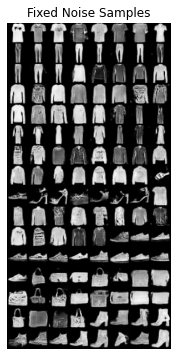

Fretchet Score 28.62852326918688
[ 34/50][ 54/469]	Loss_D: 0.8742	Loss_G: 1.6946	D(x): 0.7563	D(G(z)): 0.2375 / 0.2032
[ 34/50][154/469]	Loss_D: 0.8521	Loss_G: 1.3695	D(x): 0.7378	D(G(z)): 0.1726 / 0.2760
[ 34/50][254/469]	Loss_D: 0.9872	Loss_G: 1.8067	D(x): 0.7898	D(G(z)): 0.3507 / 0.1888
[ 34/50][354/469]	Loss_D: 1.2406	Loss_G: 1.2155	D(x): 0.7156	D(G(z)): 0.4670 / 0.3410
[ 34/50][454/469]	Loss_D: 1.1293	Loss_G: 1.4863	D(x): 0.6855	D(G(z)): 0.3768 / 0.2506


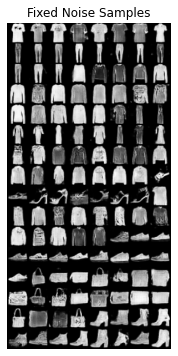

Fretchet Score 23.876037201512652
[ 35/50][ 85/469]	Loss_D: 0.9044	Loss_G: 1.4195	D(x): 0.7475	D(G(z)): 0.2512 / 0.2692
[ 35/50][185/469]	Loss_D: 0.8985	Loss_G: 1.7222	D(x): 0.7184	D(G(z)): 0.2103 / 0.1948
[ 35/50][285/469]	Loss_D: 1.0035	Loss_G: 1.4757	D(x): 0.7791	D(G(z)): 0.3554 / 0.2540
[ 35/50][385/469]	Loss_D: 0.8961	Loss_G: 1.3774	D(x): 0.7498	D(G(z)): 0.2464 / 0.2964


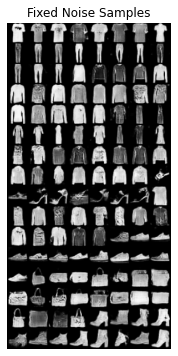

Fretchet Score 23.64010859653341
[ 36/50][ 16/469]	Loss_D: 0.9502	Loss_G: 2.0507	D(x): 0.7395	D(G(z)): 0.2826 / 0.1493
[ 36/50][116/469]	Loss_D: 0.8270	Loss_G: 1.7783	D(x): 0.8069	D(G(z)): 0.2122 / 0.1881
[ 36/50][216/469]	Loss_D: 0.8814	Loss_G: 1.8179	D(x): 0.7756	D(G(z)): 0.2609 / 0.1905
[ 36/50][316/469]	Loss_D: 0.9412	Loss_G: 2.1117	D(x): 0.8117	D(G(z)): 0.3195 / 0.1431
[ 36/50][416/469]	Loss_D: 0.9354	Loss_G: 1.9769	D(x): 0.7415	D(G(z)): 0.2751 / 0.1598


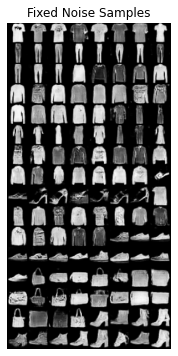

Fretchet Score 22.58042276031909
[ 37/50][ 47/469]	Loss_D: 0.8935	Loss_G: 2.0138	D(x): 0.7295	D(G(z)): 0.1963 / 0.1493
[ 37/50][147/469]	Loss_D: 0.8851	Loss_G: 1.5777	D(x): 0.7546	D(G(z)): 0.2191 / 0.2270
[ 37/50][247/469]	Loss_D: 0.8188	Loss_G: 1.6378	D(x): 0.8570	D(G(z)): 0.2503 / 0.2284
[ 37/50][347/469]	Loss_D: 0.8460	Loss_G: 1.8189	D(x): 0.7679	D(G(z)): 0.1969 / 0.1713
[ 37/50][447/469]	Loss_D: 0.8797	Loss_G: 1.9833	D(x): 0.8168	D(G(z)): 0.2765 / 0.1565


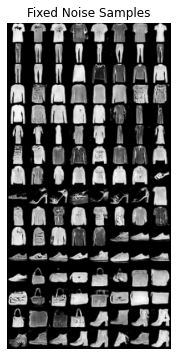

Fretchet Score 21.642245917367497
[ 38/50][ 78/469]	Loss_D: 0.9124	Loss_G: 1.8925	D(x): 0.7455	D(G(z)): 0.2591 / 0.1592
[ 38/50][178/469]	Loss_D: 1.0135	Loss_G: 1.2211	D(x): 0.6822	D(G(z)): 0.2800 / 0.3398
[ 38/50][278/469]	Loss_D: 0.9267	Loss_G: 1.8680	D(x): 0.7548	D(G(z)): 0.2925 / 0.1776
[ 38/50][378/469]	Loss_D: 0.8317	Loss_G: 1.6782	D(x): 0.8671	D(G(z)): 0.2593 / 0.2060


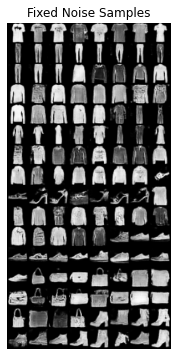

Fretchet Score 23.336391474432432
[ 39/50][  9/469]	Loss_D: 0.9330	Loss_G: 2.3227	D(x): 0.8024	D(G(z)): 0.3237 / 0.1092
[ 39/50][109/469]	Loss_D: 0.8706	Loss_G: 1.3862	D(x): 0.7198	D(G(z)): 0.1586 / 0.2861
[ 39/50][209/469]	Loss_D: 0.8856	Loss_G: 1.3806	D(x): 0.6989	D(G(z)): 0.1547 / 0.2941
[ 39/50][309/469]	Loss_D: 0.9255	Loss_G: 2.0089	D(x): 0.8342	D(G(z)): 0.3412 / 0.1488
[ 39/50][409/469]	Loss_D: 1.0053	Loss_G: 1.4351	D(x): 0.7188	D(G(z)): 0.3124 / 0.2752


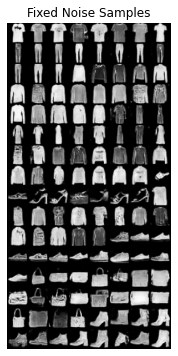

Fretchet Score 28.485936130005538
[ 40/50][ 40/469]	Loss_D: 0.9994	Loss_G: 1.0714	D(x): 0.6065	D(G(z)): 0.1242 / 0.3799
[ 40/50][140/469]	Loss_D: 0.8684	Loss_G: 1.6370	D(x): 0.7865	D(G(z)): 0.2448 / 0.2119
[ 40/50][240/469]	Loss_D: 0.8377	Loss_G: 1.6294	D(x): 0.7421	D(G(z)): 0.1664 / 0.2237
[ 40/50][340/469]	Loss_D: 0.8455	Loss_G: 2.0839	D(x): 0.8725	D(G(z)): 0.2695 / 0.1532
[ 40/50][440/469]	Loss_D: 1.2447	Loss_G: 1.0770	D(x): 0.5795	D(G(z)): 0.3646 / 0.3792


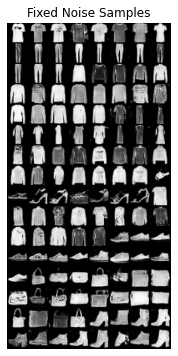

Fretchet Score 30.713899842134424
[ 41/50][ 71/469]	Loss_D: 0.8774	Loss_G: 1.5550	D(x): 0.7697	D(G(z)): 0.2304 / 0.2441
[ 41/50][171/469]	Loss_D: 0.9501	Loss_G: 1.8945	D(x): 0.7113	D(G(z)): 0.2507 / 0.1647
[ 41/50][271/469]	Loss_D: 0.7910	Loss_G: 1.8264	D(x): 0.7898	D(G(z)): 0.1501 / 0.1839
[ 41/50][371/469]	Loss_D: 1.0189	Loss_G: 1.4942	D(x): 0.7658	D(G(z)): 0.3619 / 0.2573


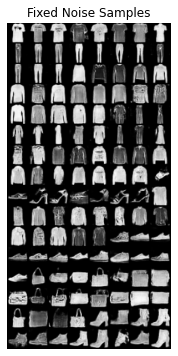

Fretchet Score 25.893635973670847
[ 42/50][  2/469]	Loss_D: 0.9794	Loss_G: 1.3534	D(x): 0.6617	D(G(z)): 0.2123 / 0.2855
[ 42/50][102/469]	Loss_D: 0.8991	Loss_G: 1.5627	D(x): 0.7486	D(G(z)): 0.2165 / 0.2377
[ 42/50][202/469]	Loss_D: 1.3410	Loss_G: 0.8903	D(x): 0.4274	D(G(z)): 0.1204 / 0.4671
[ 42/50][302/469]	Loss_D: 0.9119	Loss_G: 2.0558	D(x): 0.8163	D(G(z)): 0.2902 / 0.1373
[ 42/50][402/469]	Loss_D: 1.0173	Loss_G: 1.2206	D(x): 0.6281	D(G(z)): 0.2137 / 0.3401


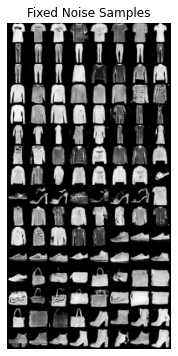

Fretchet Score 26.723796440587773
[ 43/50][ 33/469]	Loss_D: 1.1318	Loss_G: 2.0403	D(x): 0.8948	D(G(z)): 0.4670 / 0.1453
[ 43/50][133/469]	Loss_D: 1.2403	Loss_G: 1.1961	D(x): 0.6419	D(G(z)): 0.4044 / 0.3385
[ 43/50][233/469]	Loss_D: 0.9401	Loss_G: 1.6621	D(x): 0.8236	D(G(z)): 0.3228 / 0.2203
[ 43/50][333/469]	Loss_D: 0.8875	Loss_G: 1.4802	D(x): 0.8131	D(G(z)): 0.2825 / 0.2574
[ 43/50][433/469]	Loss_D: 0.9966	Loss_G: 1.5297	D(x): 0.6926	D(G(z)): 0.2778 / 0.2533


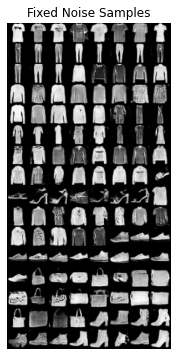

Fretchet Score 18.49256613595801
[ 44/50][ 64/469]	Loss_D: 0.8804	Loss_G: 1.9969	D(x): 0.7327	D(G(z)): 0.2013 / 0.1595
[ 44/50][164/469]	Loss_D: 0.8882	Loss_G: 1.3076	D(x): 0.7098	D(G(z)): 0.1223 / 0.3063
[ 44/50][264/469]	Loss_D: 0.9480	Loss_G: 2.1312	D(x): 0.8424	D(G(z)): 0.3356 / 0.1350
[ 44/50][364/469]	Loss_D: 1.0436	Loss_G: 2.0720	D(x): 0.8172	D(G(z)): 0.3992 / 0.1594
[ 44/50][464/469]	Loss_D: 0.9709	Loss_G: 1.9325	D(x): 0.8138	D(G(z)): 0.3648 / 0.1643


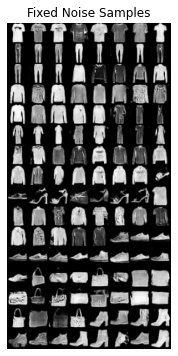

Fretchet Score 19.64320377215683
[ 45/50][ 95/469]	Loss_D: 1.0393	Loss_G: 1.9617	D(x): 0.8103	D(G(z)): 0.3937 / 0.1619
[ 45/50][195/469]	Loss_D: 0.9548	Loss_G: 1.4656	D(x): 0.7012	D(G(z)): 0.2633 / 0.2657
[ 45/50][295/469]	Loss_D: 0.9941	Loss_G: 1.6424	D(x): 0.6610	D(G(z)): 0.1900 / 0.2325
[ 45/50][395/469]	Loss_D: 0.9464	Loss_G: 1.9546	D(x): 0.7492	D(G(z)): 0.2775 / 0.1678


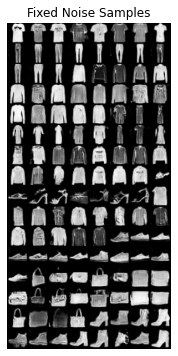

Fretchet Score 29.459788534756434
[ 46/50][ 26/469]	Loss_D: 1.0503	Loss_G: 1.2604	D(x): 0.6005	D(G(z)): 0.1702 / 0.3176
[ 46/50][126/469]	Loss_D: 0.9546	Loss_G: 1.4195	D(x): 0.6937	D(G(z)): 0.2285 / 0.2771
[ 46/50][226/469]	Loss_D: 0.9147	Loss_G: 1.6972	D(x): 0.6832	D(G(z)): 0.1377 / 0.2216
[ 46/50][326/469]	Loss_D: 1.1336	Loss_G: 1.4307	D(x): 0.7471	D(G(z)): 0.4198 / 0.2700
[ 46/50][426/469]	Loss_D: 0.9093	Loss_G: 1.5712	D(x): 0.7740	D(G(z)): 0.2724 / 0.2358


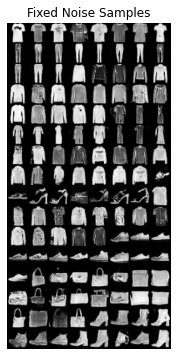

Fretchet Score 26.98159301277351
[ 47/50][ 57/469]	Loss_D: 0.9636	Loss_G: 1.3271	D(x): 0.6360	D(G(z)): 0.1693 / 0.2921
[ 47/50][157/469]	Loss_D: 0.8512	Loss_G: 1.8356	D(x): 0.8103	D(G(z)): 0.2552 / 0.1823
[ 47/50][257/469]	Loss_D: 0.8753	Loss_G: 1.7453	D(x): 0.7522	D(G(z)): 0.2108 / 0.2051
[ 47/50][357/469]	Loss_D: 0.9180	Loss_G: 2.2994	D(x): 0.8214	D(G(z)): 0.3142 / 0.1113
[ 47/50][457/469]	Loss_D: 0.8551	Loss_G: 1.7033	D(x): 0.7999	D(G(z)): 0.2100 / 0.2091


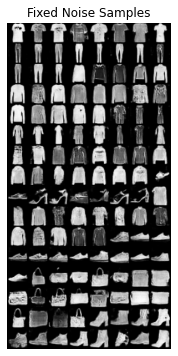

Fretchet Score 18.97524191596259
[ 48/50][ 88/469]	Loss_D: 0.9604	Loss_G: 1.1959	D(x): 0.6258	D(G(z)): 0.1070 / 0.3357
[ 48/50][188/469]	Loss_D: 0.8227	Loss_G: 1.3640	D(x): 0.8170	D(G(z)): 0.2316 / 0.2928
[ 48/50][288/469]	Loss_D: 0.8118	Loss_G: 1.5067	D(x): 0.8497	D(G(z)): 0.2223 / 0.2547
[ 48/50][388/469]	Loss_D: 0.8050	Loss_G: 1.2380	D(x): 0.8113	D(G(z)): 0.2035 / 0.3393


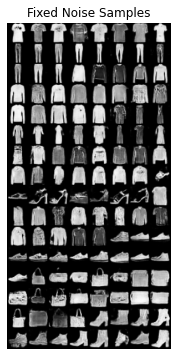

Fretchet Score 32.73065133339154
[ 49/50][ 19/469]	Loss_D: 0.9985	Loss_G: 1.7388	D(x): 0.7892	D(G(z)): 0.3519 / 0.2150
[ 49/50][119/469]	Loss_D: 1.0993	Loss_G: 1.4489	D(x): 0.5603	D(G(z)): 0.1613 / 0.2649
[ 49/50][219/469]	Loss_D: 0.8423	Loss_G: 1.6087	D(x): 0.8190	D(G(z)): 0.2465 / 0.2275
[ 49/50][319/469]	Loss_D: 0.9134	Loss_G: 1.3820	D(x): 0.7710	D(G(z)): 0.2788 / 0.2862
[ 49/50][419/469]	Loss_D: 0.9432	Loss_G: 1.9536	D(x): 0.8193	D(G(z)): 0.3379 / 0.1576
Last model saved.


In [14]:
# Lists to keep track of progress
img_list = []
losses=[]
D_x_list = []
D_z_list = []
best=np.inf
iters = 0

writer_real = SummaryWriter(f"logs/GAN_MNIST/real")
writer_fake = SummaryWriter(f"logs/GAN_MNIST/fake")
writer0 = SummaryWriter(f"logs/GAN_MNIST/loss")


print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):

    # For each batch in the dataloader
    for i, data in enumerate(data_loader):


        # (1) Update D network: maximize log(D(x|y)) + log(1 - D(G(z|y)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        
        # Format batch
        real_image = data[0].to(device)

        b_size = real_image.size(0)

        real_label = torch.full((b_size,), real_label_num).to(device)
        fake_label = torch.full((b_size,), fake_label_num).to(device)
        
        G_label = label_1hots[data[1]]
        D_label = label_fills[data[1]]
        
        # Forward pass real batch through D
        output = netD(real_image, D_label).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, real_label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1).to(device)
        # Generate fake image batch with G
        fake = netG(noise, G_label)
        # Classify all fake batch with D
        output = netD(fake.detach(), D_label).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, fake_label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        
        # (2) Update G network: maximize log(D(G(z|y)))
        ###########################
        netG.zero_grad()
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake, D_label).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, real_label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # print the training losses
        if iters % 100 == 0:
          print('[%3d/%d][%3d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f' % (epoch, 
              num_epochs, i, len(data_loader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
          writer0.add_scalars('Discrimitor-Generator Losses', {'Discrimitor Loss':errD.item(),
                                    'Generator':errG.item()}, iters)
                  
        if (iters % 469 == 0):
          losses.append((errD.item(), errG.item()))
          
          # Add values to plots
          netG.eval()  
          with torch.no_grad():
            fake_fixed = netG(fixed_noise,fixed_label).cpu()
            img_list.append(vutils.make_grid(fake_fixed, padding=2, normalize=True))
            img_grid_real = torchvision.utils.make_grid(real_image[:128], normalize=True)
            img_grid_fake = torchvision.utils.make_grid(fake_fixed[:128], normalize=True)

            writer_real.add_image("Real", img_grid_real, global_step=iters)
            writer_fake.add_image("Fake", img_grid_fake, global_step=iters)
            # display the images inline as well
            fig, ax = plt.subplots(1, 1, figsize=(6, 6))
            ax.imshow(np.transpose(vutils.make_grid(fake_fixed, padding=2, normalize=True), (1, 2, 0)))
            ax.axis('off')
            ax.set_title('Fixed Noise Samples')
            plt.show()

            fake_fixed = scale_images(fake_fixed, (299,299,3))
            # change the real_images' shape too - so that it keep matching
            # fake_images' shape.
            real_image = scale_images(real_image.cpu(), (299,299,3))

            fake_fixed=interpolate(fake_fixed)
            real_image=interpolate(real_image)

            fretchet_dist=calculate_fretchet(real_image.to(device),fake_fixed.to(device),model) 
            print("Fretchet Score",fretchet_dist)
            writer0.add_scalar('Fretchet Score', fretchet_dist,iters)

            PATH = "Generator_model.pth"
            if fretchet_dist < best:
              best = fretchet_dist
              torch.save(netG, PATH)
              print("model saved.")
            
        iters += 1

torch.save(netG, "Generator_model_last_epoch.pth")
print("Last model saved.")

writer_real.close()
writer_fake.close()
writer0.close()

# Loss and Results in Tensorboard 

In [23]:
%load_ext tensorboard
%tensorboard --logdir=logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 304), started 0:00:08 ago. (Use '!kill 304' to kill it.)

<IPython.core.display.Javascript object>

In [24]:
!zip -r logs.zip logs/ 

updating: logs/ (stored 0%)
updating: logs/GAN_MNIST/ (stored 0%)
updating: logs/GAN_MNIST/real/ (stored 0%)
updating: logs/GAN_MNIST/real/events.out.tfevents.1639042894.9d8a9d552e48.73.0 (deflated 2%)
updating: logs/GAN_MNIST/loss/ (stored 0%)
updating: logs/GAN_MNIST/loss/Discrimitor-Generator Losses_Generator/ (stored 0%)
updating: logs/GAN_MNIST/loss/Discrimitor-Generator Losses_Generator/events.out.tfevents.1639042897.9d8a9d552e48.73.4 (deflated 72%)
updating: logs/GAN_MNIST/loss/events.out.tfevents.1639042894.9d8a9d552e48.73.2 (deflated 61%)
updating: logs/GAN_MNIST/loss/Discrimitor-Generator Losses_Discrimitor Loss/ (stored 0%)
updating: logs/GAN_MNIST/loss/Discrimitor-Generator Losses_Discrimitor Loss/events.out.tfevents.1639042897.9d8a9d552e48.73.3 (deflated 72%)
updating: logs/GAN_MNIST/fake/ (stored 0%)
updating: logs/GAN_MNIST/fake/events.out.tfevents.1639042894.9d8a9d552e48.73.1 (deflated 2%)


# Generate one sample for choosen Category

In [25]:
idx_to_label = {
    'T-shirt/top': 0,
    'Trouser': 1,
    'Pullover': 2,
    'Dress': 3,
    'Coat': 4,
    'Sandal': 5,
    'Shirt': 6,
    'Sneaker': 7,
    'Bag': 8,
    'Ankle boot': 9
}


In [26]:
def create_noise_label(batch_size,nz):
    z = torch.randn(batch_size, nz, 1, 1).to(device)
    t_test = torch.randint(0, 10, (batch_size,)).sort().values
    n = 0
    for i in range(100):
        t_test[i] = n
        if (i+1)%10 == 0:
            n += 1
    return z,t_test

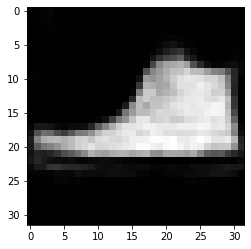

In [29]:
from torchvision.utils import save_image
def Generate_samples(category,model):
    # Labels for test.  
    #netG = Generator(10)
    # Create the generator

    # Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
    #netG.apply(weights_init)
    netG=torch.load(model).cpu()

    netG.eval()
    z,t_test = create_noise_label(batch_size,nz)
    label_1hot = label_1hots[t_test]
    nx = t_test.numpy()

    index=np.where(nx == idx_to_label[category])[0][0]

    sample_images = netG(z.cpu(), label_1hot.cpu()).data.cpu()
    plt.imshow(sample_images[index].squeeze(0),cmap="gray")
    #plt.savefig('test1.png')

    img1 = sample_images[index].squeeze(0)
    # img1 = img1.numpy() # TypeError: tensor or list of tensors expected, got <class 'numpy.ndarray'>
    save_image(img1, 'img1.png')
    return sample_images[index].squeeze(0)
# Test
fake=Generate_samples("Sneaker","Generator_model_last_epoch.pth") # n:0-99

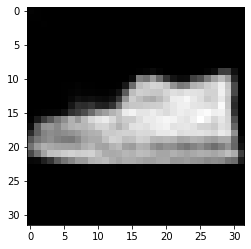

In [30]:
fake=Generate_samples("Sneaker","Generator_model.pth") # n:0-99

# Training Evaluation

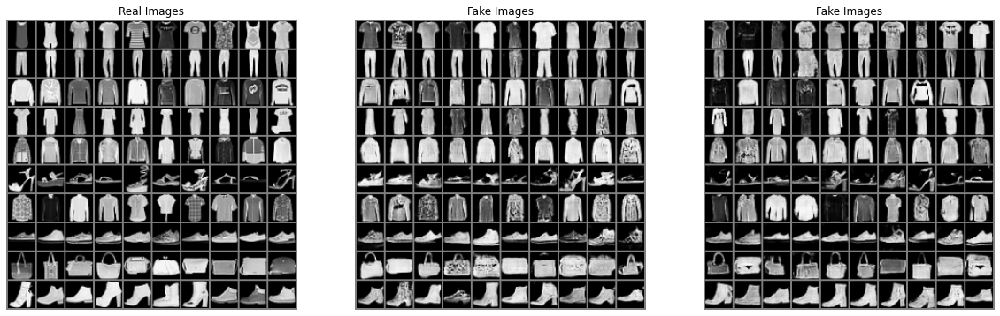

In [31]:
# Size of the Figure
plt.figure(figsize=(20,10))

# Plot the real images
plt.subplot(1,3,1)
plt.axis('off')
plt.title("Real Images")
imgs = utils.make_grid(imgs, nrow=10)
plt.imshow(imgs.permute(1, 2, 0)*0.5+0.5)

# Load the Best Generative Model

netG=torch.load('Generator_model.pth').cpu()
netG.eval()
#Generate random noise and labels for 10 image for each category
fixed_noise = torch.randn(100, nz, 1, 1).to(device)
fixed_label = label_1hots[torch.arange(10).repeat(10).sort().values]

# Generate the Fake Images
with torch.no_grad():
    fake = netG(fixed_noise.cpu(), fixed_label.cpu())

# Plot the fake images
plt.subplot(1,3,2)
plt.axis("off")
plt.title("Fake Images")
fake = utils.make_grid(fake, nrow=10)
plt.imshow(fake.permute(1, 2, 0)*0.5+0.5)

netG=torch.load('Generator_model_last_epoch.pth').cpu()
netG.eval()
#Generate random noise and labels for 10 image for each category
fixed_noise = torch.randn(100, nz, 1, 1).to(device)
fixed_label = label_1hots[torch.arange(10).repeat(10).sort().values]

# Generate the Fake Images
with torch.no_grad():
    fake = netG(fixed_noise.cpu(), fixed_label.cpu())

# Plot the fake images
plt.subplot(1,3,3)
plt.axis("off")
plt.title("Fake Images")
fake = utils.make_grid(fake, nrow=10)
plt.imshow(fake.permute(1, 2, 0)*0.5+0.5)

# Save the comparation result
plt.savefig('result.jpg', bbox_inches='tight')

In [32]:
!zip -r generator_model.zip Generator_model_last_epoch.pth

  adding: Generator_model_last_epoch.pth (deflated 7%)


**In the end I downloaded tensorboard logs and trained generator network and added to the folder to use in my local in order to create other functions**